In [70]:
import pandas as pd
import numpy as np
census = pd.read_csv('poverty_population.csv')
crime = pd.read_csv('crime_data.csv')

In [71]:
census.tail()

,zip,population,year,Under poverty
225,19150,22774,2020,0.123
226,19151,32080,2020,0.210
227,19152,36221,2020,0.173
228,19153,12723,2020,0.190
229,19154,34699,2020,0.071


In [72]:
census = census.rename(columns = {'zip':'crime_zipcode'})

In [73]:
crime.tail()

,datetime,crime_day,crime_hour,month,year,crime_location,crime_category,crime_zipcode,lat,lng
746101,2020-12-31 22:12:54,31,22.0,12,2020,1500 BLOCK CECIL B MOORE AV,Theft,19121.0,39.979073,-75.160370
746102,2020-12-17 13:20:00,17,13.0,12,2020,4700 BLOCK N CAMAC ST,Other,19141.0,40.025045,-75.144680
746103,2020-12-30 23:48:48,30,23.0,12,2020,7300 BLOCK OGONTZ AV,Assaults,19138.0,40.065843,-75.155636
746104,2020-12-03 11:09:00,3,11.0,12,2020,0 BLOCK E PHIL ELLENA ST,Fraud,19119.0,40.052837,-75.184182
746105,2020-12-22 14:11:00,22,14.0,12,2020,4800 BLOCK PASCHALL AVE,Sex Related,19143.0,39.940273,-75.210677


In [74]:
all_data = crime.merge(census, on = ['year','crime_zipcode'], how = 'left')

In [75]:
all_data.tail()

,datetime,crime_day,crime_hour,month,year,crime_location,crime_category,crime_zipcode,lat,lng,population,Under poverty
746101,2020-12-31 22:12:54,31,22.0,12,2020,1500 BLOCK CECIL B MOORE AV,Theft,19121.0,39.979073,-75.160370,30729.0,0.445
746102,2020-12-17 13:20:00,17,13.0,12,2020,4700 BLOCK N CAMAC ST,Other,19141.0,40.025045,-75.144680,33136.0,0.253
746103,2020-12-30 23:48:48,30,23.0,12,2020,7300 BLOCK OGONTZ AV,Assaults,19138.0,40.065843,-75.155636,32508.0,0.221
746104,2020-12-03 11:09:00,3,11.0,12,2020,0 BLOCK E PHIL ELLENA ST,Fraud,19119.0,40.052837,-75.184182,28221.0,0.082
746105,2020-12-22 14:11:00,22,14.0,12,2020,4800 BLOCK PASCHALL AVE,Sex Related,19143.0,39.940273,-75.210677,62386.0,0.269


In [76]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 746106 entries, 0 to 746105
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   datetime        746106 non-null  object 
 1   crime_day       746106 non-null  int64  
 2   crime_hour      746106 non-null  float64
 3   month           746106 non-null  int64  
 4   year            746106 non-null  int64  
 5   crime_location  746106 non-null  object 
 6   crime_category  746106 non-null  object 
 7   crime_zipcode   739696 non-null  float64
 8   lat             746106 non-null  float64
 9   lng             746106 non-null  float64
 10  population      738893 non-null  float64
 11  Under poverty   738893 non-null  float64
dtypes: float64(6), int64(3), object(3)
memory usage: 74.0+ MB


In [77]:
all_data = all_data.dropna().reset_index(drop = True)

In [78]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 738893 entries, 0 to 738892
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   datetime        738893 non-null  object 
 1   crime_day       738893 non-null  int64  
 2   crime_hour      738893 non-null  float64
 3   month           738893 non-null  int64  
 4   year            738893 non-null  int64  
 5   crime_location  738893 non-null  object 
 6   crime_category  738893 non-null  object 
 7   crime_zipcode   738893 non-null  float64
 8   lat             738893 non-null  float64
 9   lng             738893 non-null  float64
 10  population      738893 non-null  float64
 11  Under poverty   738893 non-null  float64
dtypes: float64(6), int64(3), object(3)
memory usage: 67.6+ MB


In [79]:
all_data = all_data.copy()
all_data['datetime'] = pd.to_datetime(all_data['datetime'])

In [80]:
all_data['crime_zipcode'] =all_data['crime_zipcode'].astype('object') 

In [81]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 738893 entries, 0 to 738892
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   datetime        738893 non-null  datetime64[ns]
 1   crime_day       738893 non-null  int64         
 2   crime_hour      738893 non-null  float64       
 3   month           738893 non-null  int64         
 4   year            738893 non-null  int64         
 5   crime_location  738893 non-null  object        
 6   crime_category  738893 non-null  object        
 7   crime_zipcode   738893 non-null  object        
 8   lat             738893 non-null  float64       
 9   lng             738893 non-null  float64       
 10  population      738893 non-null  float64       
 11  Under poverty   738893 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(3), object(3)
memory usage: 67.6+ MB


In [82]:
all_data['weekday'] = all_data['datetime'].dt.weekday

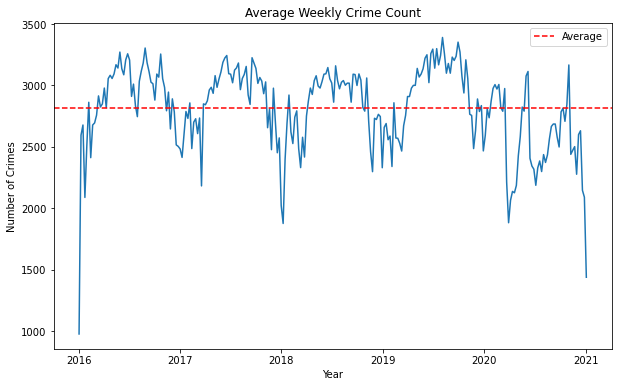

In [83]:
import pandas as pd
import matplotlib.pyplot as plt

# group the data by day and count the number of crimes
daily_crime_count = all_data.groupby(pd.Grouper(key='datetime', freq='W'))['crime_category'].count()

# calculate the average number of crimes per day
avg_daily_crime_count = daily_crime_count.mean()

# plot the daily crime count
plt.figure(figsize=(10, 6))
plt.plot(daily_crime_count.index, daily_crime_count.values)
plt.axhline(y=avg_daily_crime_count, linestyle='--', color='red', label='Average')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title('Average Weekly Crime Count')
plt.legend()
plt.show()

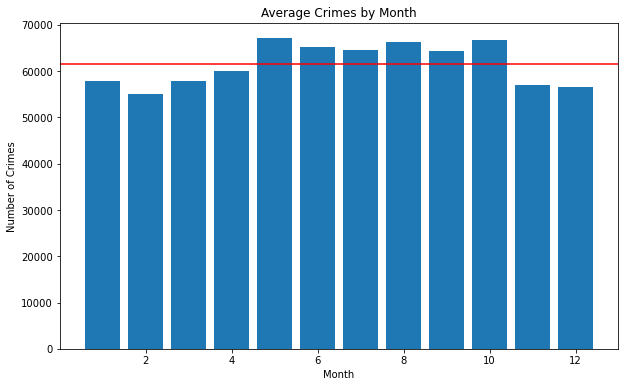

In [84]:
monthly_crime_count = all_data.groupby(all_data['datetime'].dt.month)['crime_category'].count()
monthly_mean_crime_count = all_data.groupby(all_data['datetime'].dt.month)['crime_category'].count().mean()

# Plot the average monthly crime count as a bar chart
plt.figure(figsize=(10, 6))
plt.bar(monthly_crime_count.index, monthly_crime_count.values)
plt.axhline(y=monthly_mean_crime_count, color='r', linestyle='-')
plt.title('Average Crimes by Month')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.show()

In [85]:
#pip install folium

In [86]:
import pandas as pd
import folium
from folium.plugins import HeatMap


crime_map = folium.Map(location=[all_data['lat'].mean(), all_data['lng'].mean()], zoom_start=11)

crime_heatmap = HeatMap(data=all_data[['lat', 'lng', 'crime_zipcode']].groupby(['lat', 'lng']).count().reset_index().values.tolist(), radius=15, blur=25)
crime_heatmap.add_to(crime_map)
crime_map

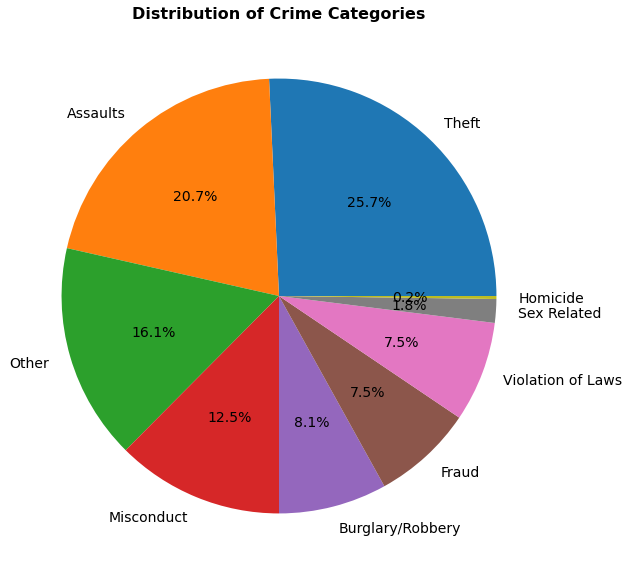

In [87]:
crime_counts = all_data['crime_category'].value_counts()
plt.figure(figsize=(10, 10))
plt.pie(crime_counts.values, labels=crime_counts.index, autopct='%1.1f%%', textprops = {'fontsize': 14})
plt.title('Distribution of Crime Categories',fontsize=16, fontweight='bold')
plt.show()

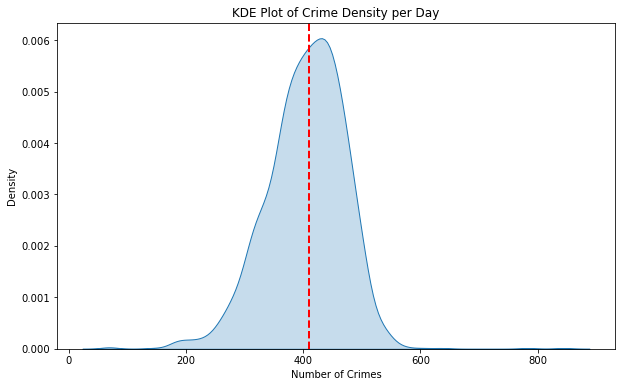

In [88]:
import seaborn as sns
daily_crime_count = all_data.groupby(pd.Grouper(key='datetime', freq='D'))['crime_category'].count()

# calculate the median of daily crime count
median_daily_crime_count = np.median(daily_crime_count)

# plot the KDE plot of daily crime count and add a median line
plt.figure(figsize=(10, 6))
sns.kdeplot(daily_crime_count, shade=True)
plt.axvline(median_daily_crime_count, color='red', linestyle='dashed', linewidth=2)
plt.xlabel('Number of Crimes')
plt.ylabel('Density')
plt.title('KDE Plot of Crime Density per Day')
plt.show()

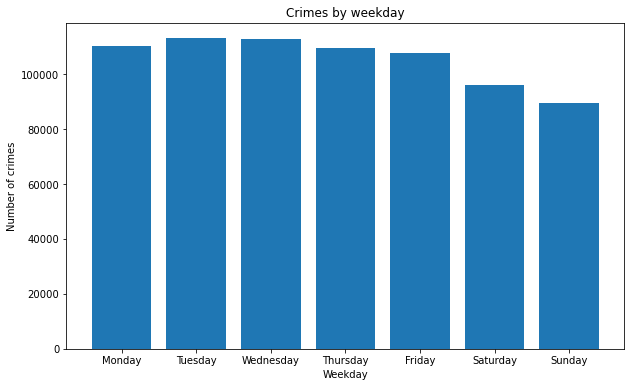

In [89]:
crimes_by_weekday = all_data.groupby('weekday').size()
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.figure(figsize=(10, 6))
plt.bar(weekday_names, crimes_by_weekday)
plt.xlabel('Weekday')
plt.ylabel('Number of crimes')
plt.title('Crimes by weekday')
plt.show()

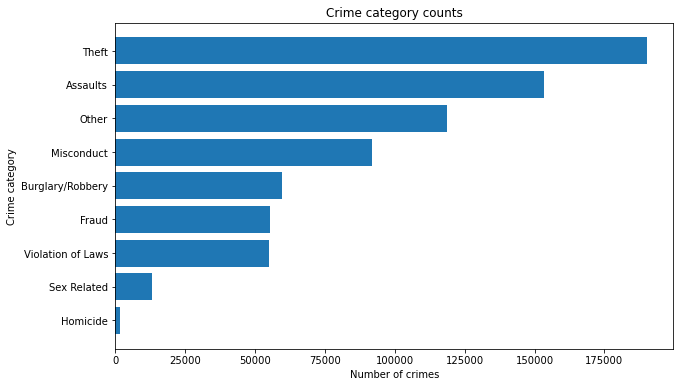

In [90]:
crime_counts = all_data.groupby('crime_category').size().sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(crime_counts.index, crime_counts.values)

ax.set_xlabel('Number of crimes')
ax.set_ylabel('Crime category')
ax.set_title('Crime category counts')

ax.invert_yaxis()

plt.show()

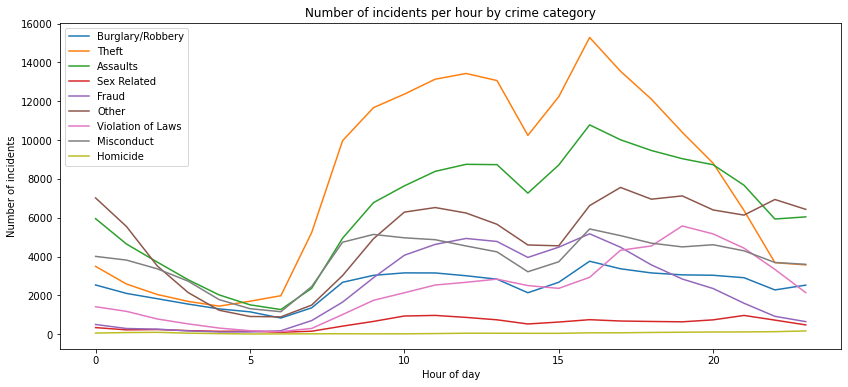

In [91]:
import matplotlib.pyplot as plt

crime_by_hour = all_data.groupby(['crime_category', 'crime_hour']).size()
fig, ax = plt.subplots(figsize=(14,6))

# Loop over each crime category
for category in all_data['crime_category'].unique():
    data = crime_by_hour[category].reset_index()
    ax.plot(data['crime_hour'], data[0], label=category)

ax.set_xlabel('Hour of day')
ax.set_ylabel('Number of incidents')
ax.set_title('Number of incidents per hour by crime category')

ax.legend()
plt.show()

In [93]:
model_data = all_data.copy()

In [94]:
model_data = model_data[['crime_hour','month','population','Under poverty','weekday','crime_category']]

In [95]:
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
model_data['weekday'] = model_data['weekday'].map(day_names)

In [96]:
model_data.tail()

,crime_hour,month,population,Under poverty,weekday,crime_category
738888,22.0,12,30729.0,0.445,Thursday,Theft
738889,13.0,12,33136.0,0.253,Thursday,Other
738890,23.0,12,32508.0,0.221,Wednesday,Assaults
738891,11.0,12,28221.0,0.082,Thursday,Fraud
738892,14.0,12,62386.0,0.269,Tuesday,Sex Related


In [97]:
model_data['crime_hour'] = model_data['crime_hour'].astype('category')
model_data['month'] = model_data['month'].astype('category')
#model_data['crime_zipcode'] = model_data['crime_zipcode'].astype('category')
model_data['weekday'] = model_data['weekday'].astype('category')

In [98]:
categorical_columns = ['crime_hour', 'month',  'weekday']
model_data = pd.get_dummies(model_data, columns=categorical_columns)

In [99]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
numerical_columns = ['population', 'Under poverty']
model_data[numerical_columns] = scaler.fit_transform(model_data[numerical_columns])

In [100]:
from sklearn.model_selection import train_test_split

X = model_data.drop('crime_category', axis=1)
y = model_data['crime_category']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Logistic Regression

In [101]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(max_iter=100)
clf.fit(X_train, y_train)

/Users/akshayjain/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [102]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

/Users/akshayjain/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.2853044072567821
Precision: 0.2208142661543878
Recall: 0.2853044072567821
F1-score: 0.21228608020787756


## Random Forest

In [103]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf_clf = RandomForestClassifier(n_estimators=25, random_state=42,criterion='entropy')
rf_clf.fit(X, y)
y_pred_rf = rf_clf.predict(X)

In [104]:
y_pred_rf = rf_clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf, average='weighted')
recall = recall_score(y_test, y_pred_rf, average='weighted')
f1 = f1_score(y_test, y_pred_rf, average='weighted')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.5834049492823744
Precision: 0.5814809087915593
Recall: 0.5834049492823744
F1-score: 0.5797846283317483


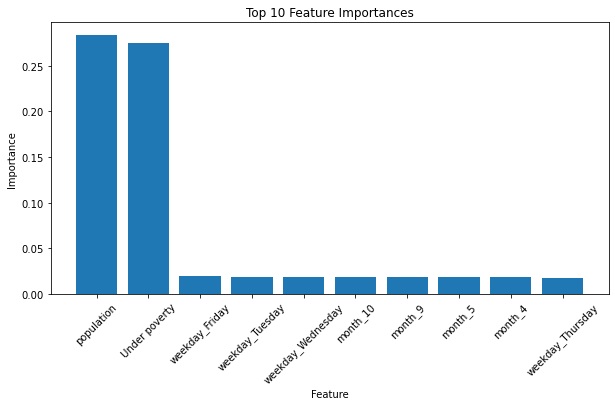

In [105]:
importances = rf_clf.feature_importances_

# Sort the importances in descending order
indices = importances.argsort()[::-1]

# Get the top 10 feature names and importances
top_features = X.columns[indices][:10]
top_importances = importances[indices][:10]

plt.figure(figsize=(10, 5))
plt.bar(top_features, top_importances)
plt.xticks(rotation=45)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Top 10 Feature Importances")
plt.show()


**If we have datetime, population and poverty data of a particular zipcode of philadelphia then we can predict the type of crime in that zipcode with an accuracy of 58.34%** 